<a href="https://colab.research.google.com/github/LL-green-hub/CodeForPFAS_VOC_NHANES20052020/blob/main/0916forGitHub_SHAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
import shap
import statsmodels.api as sm
from matplotlib.colors import Normalize

def plot_panel_internal(df_ready, target_voc, voc_display_name, do_imputation=True):
    pfas_list = ['PFNA', 'PFOS', 'PFOA', 'PFHxS']
    covariates = ['AGE', 'GENDER', 'URINE_CREATININE', 'eGFR']
    LOWESS_FRAC = 0.50

    df_plot = df_ready.copy()

    y_adjusted = (df_plot[target_voc] / df_plot['URINE_CREATININE']) * 100
    df_plot['Y_LOG'] = np.log(y_adjusted.replace(0, np.nan))

    fig, axes = plt.subplots(2, 2, figsize=(16, 14), dpi=300)
    axes = axes.flatten()
    GLOBAL_Y_MIN, GLOBAL_Y_MAX = -0.22, 0.18
    classic_balanced_cmap = plt.cm.RdYlBu_r
    vmin_raw, vmax_raw = 60.0, 120.0
    norm_virtual = Normalize(vmin=0.0, vmax=1.0)
    panel_labels = ['A', 'B', 'C', 'D']

    last_scatter = None

    for idx, pfas in enumerate(pfas_list):
        if pfas not in df_plot.columns:
            continue
        ax = axes[idx]

        pfas_series = df_plot[pfas].copy()


        if do_imputation:
            min_detectable = pfas_series[pfas_series > 0].min()
            lod_val = min_detectable / np.sqrt(2) if not np.isnan(min_detectable) else 0.01
            pfas_series = pfas_series.replace(0, lod_val)
            df_plot[f'{pfas}_LOG'] = np.log(pfas_series)
        else:
            df_plot[f'{pfas}_LOG'] = np.log(pfas_series.replace(0, np.nan))
        current_features = [f'{pfas}_LOG'] + covariates
        fit_df = df_plot[current_features + ['Y_LOG']].dropna().copy()

        if len(fit_df) < 10:
            print(f"⚠️ {pfas} ({len(fit_df)})")
            continue

        X = fit_df[current_features].copy()
        Y = fit_df['Y_LOG']
        X.columns = [col.upper() for col in X.columns]

        model = RandomForestRegressor(n_estimators=150, max_depth=5, random_state=42, n_jobs=-1)
        model.fit(X, Y)
        explainer = shap.TreeExplainer(model)
        shap_values_raw = explainer.shap_values(X, check_additivity=False)

        shap_matrix = shap_values_raw[..., 0] if len(shap_values_raw.shape) == 3 else shap_values_raw
        pfas_feat_idx = X.columns.get_loc(f'{pfas}_LOG'.upper())
        x_data = X[f'{pfas}_LOG'.upper()].values
        y_shap = shap_matrix[:, pfas_feat_idx]

        c_egfr_current = X['EGFR'].values
        c_egfr_virtual = np.clip((c_egfr_current - vmin_raw) / (vmax_raw - vmin_raw), 0.0, 1.0)
        sort_indices = np.argsort(c_egfr_virtual)[::-1]

        x_range = np.max(x_data) - np.min(x_data)
        jitter = np.random.normal(0, x_range * 0.003, size=len(x_data))
        x_plot_final = np.where(x_data == np.min(x_data), x_data + np.abs(jitter), x_data)

        last_scatter = ax.scatter(x_plot_final[sort_indices], y_shap[sort_indices], c=c_egfr_virtual[sort_indices],
                                  cmap=classic_balanced_cmap, s=35, alpha=0.78, edgecolor='none', zorder=2, norm=norm_virtual)

        p_low, p_high = np.percentile(x_data, [2.0, 98.0])
        fit_mask = (x_data >= p_low) & (x_data <= p_high)
        lowess_fit = sm.nonparametric.lowess(y_shap[fit_mask], x_data[fit_mask], frac=LOWESS_FRAC)

        ax.plot(lowess_fit[:, 0], lowess_fit[:, 1], color='#111111', linewidth=3.8, linestyle='-', label='LOWESS Trend', zorder=5)

        x_pmin, x_pmax = np.percentile(x_data, [0.5, 99.5])
        ax.set_xlim(x_pmin - 0.15, x_pmax + 0.15)
        ax.set_ylim(GLOBAL_Y_MIN, GLOBAL_Y_MAX)
        ax.axhline(0, color='#7f8c8d', linestyle='--', linewidth=1.2, zorder=1)
        ax.grid(True, linestyle=':', alpha=0.3, zorder=1)

        for spine in ax.spines.values():
            spine.set_color('black')
            spine.set_linewidth(2.0)
        ax.tick_params(axis='both', colors='black', width=2.0, length=5, labelsize=12)
        for tick in ax.get_xticklabels() + ax.get_yticklabels():
            tick.set_fontweight('bold')

        ax.set_xlabel(f'Serum Log-Concentration of {pfas}', fontsize=13, fontweight='bold', labelpad=6)
        ax.set_ylabel(f'SHAP Value for {pfas}\n(Impact on Urinary Excretion)', fontsize=11, fontweight='bold', labelpad=6)

        clean_sub_title = voc_display_name.split()
        ax.set_title(f"({panel_labels[idx]}) {pfas} vs. {clean_sub_title}", fontsize=14, fontweight='bold', pad=10, loc='left', color='#111111')
        ax.legend(loc='upper right', frameon=True, facecolor='white', edgecolor='none', fontsize=10, prop={'weight':'bold'}).set_zorder(6)

    title_suffix = " (Sensitivity Analysis: No Imputation)" if not do_imputation else ""
    plt.suptitle(f"SHAP Analysis for Urinary {voc_display_name}{title_suffix}",
                 fontsize=16, fontweight='bold', y=0.97, color='black')
    fig.subplots_adjust(right=0.86, hspace=0.25, wspace=0.28)

    if last_scatter is not None:
        cbar_ax = fig.add_axes([0.89, 0.15, 0.018, 0.7])
        cbar = fig.colorbar(last_scatter, cax=cbar_ax)
        cbar.set_ticks(np.linspace(0.0, 1.0, 5))
        cbar.set_ticklabels(["60", "75", "90", "105", "120"])
        cbar.set_label('Renal Function Baseline (eGFR, mL/min/1.73m²)', fontsize=13, fontweight='bold', color='black', labelpad=12)
        cbar.ax.tick_params(labelsize=11)
        cbar.ax.spines['outline'].set_color('black')
        cbar.ax.spines['outline'].set_linewidth(2.0)
        for tick in cbar.ax.get_yticklabels():
            tick.set_fontweight('bold')

    short_name = voc_display_name.replace(" ", "_")
    output_filename = f"Supplementary_Figure_S4_{short_name}_No_Imputation.png" if not do_imputation else f"{short_name}_SHAP_dependence_plot.png"
    plt.savefig(output_filename, dpi=300, bbox_inches='tight', pad_inches=0.25)
    print(f"➡️  {os.path.abspath(output_filename)} ")
    plt.show()
    plt.close()


In [ ]:
print(".")
folder_path = "/content"

configs = [
    ('05-06', 'D', '06'),
    ('07-08', 'E', '08'),
    ('09-10', 'F', '10'),
    ('11-12', 'G', '12'),
    ('13-14', 'H', '14'),
    ('15-16', 'I', '16'),
    ('17-20', '20', '20')
]

all_files = os.listdir(folder_path)
all_cycle_dfs = []

def fetch_and_read(pattern, cycle_suffix, year_flag):
    for f in all_files:
        f_upper = f.upper()
        if f_upper.endswith('.XPT'):
            type_match = False
            if pattern == 'PFAS' and ('PFC' in f_upper or 'PFAS' in f_upper): type_match = True
            elif pattern == 'DEMO' and 'DEMO' in f_upper: type_match = True
            elif pattern == 'UVOC' and 'UVOC' in f_upper: type_match = True
            elif pattern == 'BIOPRO' and ('BIOPRO' in f_upper or 'LAB18' in f_upper): type_match = True

            if type_match:
                if f"_{cycle_suffix}" in f_upper or (cycle_suffix == '20' and 'P_' in f_upper) or (year_flag in f_upper):
                    try:
                        df_tmp = pd.read_sas(os.path.join(folder_path, f), format='xport')
                        df_tmp.columns = df_tmp.columns.str.upper()
                        return df_tmp
                    except Exception as e:
                        print(f" {f}: {e}")
    return None

for cycle, suffix, yr in configs:
    print(f" ⏳ {cycle} ...")
    df_pfas = fetch_and_read('PFAS', suffix, yr)
    df_demo = fetch_and_read('DEMO', suffix, yr)
    df_uvoc = fetch_and_read('UVOC', suffix, yr)
    df_alb  = fetch_and_read('BIOPRO', suffix, yr)

    if df_pfas is not None and df_demo is not None:
        df_pfas['SEQN'] = df_pfas['SEQN'].astype(int)
        df_demo['SEQN'] = df_demo['SEQN'].astype(int)

        merged_cycle = pd.merge(df_demo, df_pfas, on='SEQN', how='left')

        if df_uvoc is not None:
            df_uvoc['SEQN'] = df_uvoc['SEQN'].astype(int)
            merged_cycle = pd.merge(merged_cycle, df_uvoc, on='SEQN', how='left')
        if df_alb is not None:
            df_alb['SEQN'] = df_alb['SEQN'].astype(int)
            merged_cycle = pd.merge(merged_cycle, df_alb, on='SEQN', how='left')

        merged_cycle['Cycle'] = cycle
        all_cycle_dfs.append(merged_cycle)
        print(f"   ✅ {cycle} ")


print("..")
master = pd.concat(all_cycle_dfs, ignore_index=True, sort=False)


.
 ⏳ 05-06 ...
   ✅ 05-06 
 ⏳ 07-08 ...
   ✅ 07-08 
 ⏳ 09-10 ...
   ✅ 09-10 
 ⏳ 11-12 ...
   ✅ 11-12 
 ⏳ 13-14 ...
   ✅ 13-14 
 ⏳ 15-16 ...
   ✅ 15-16 
 ⏳ 17-20 ...
   ✅ 17-20 
..


In [ ]:
print(" [2/4] .")

pfas_map = {
    'LBXPFOA': 'PFOA', 'LBXPFOS': 'PFOS', 'LBXPFA': 'PFNA', 'LBXPFNA': 'PFNA', 'LBXPFHS': 'PFHxS',
    'LBDWFOLC': 'PFOA', 'LBDWOSLC': 'PFOS', 'LBDWNALC': 'PFNA', 'LBDWHSLC': 'PFHxS'
}
master.rename(columns=pfas_map, inplace=True)

ma_possible_cols = ['URXMA', 'URXPGA', 'URXMA_']
existing_ma_cols = [col for col in ma_possible_cols if col in master.columns]
if existing_ma_cols:
    master['URXMA'] = master[existing_ma_cols].bfill(axis=1).iloc[:, 0]
    print(f"{existing_ma_cols}")

master['AGE'] = master.get('RIDAGEYR', master.get('RIDAGE'))
master['GENDER'] = master.get('RIAGENDR')
master['URINE_CREATININE'] = master.get('URXUCR')
master['SERUM_CREATININE'] = master.get('LBXSCR', master.get('LBXSC1'))

master['RACE_ETHNICITY'] = master.get('RIDRETH3', master.get('RIDRETH1'))

print("..")
is_female = (master['GENDER'] == 2)
kappa = np.where(is_female, 0.7, 0.9)
alpha = np.where(is_female, -0.241, -0.302)
gender_constant = np.where(is_female, 1.012, 1.0)
scr_div_kappa = np.clip(master['SERUM_CREATININE'] / kappa, 1e-5, None)
term_min = np.minimum(scr_div_kappa, 1.0) ** alpha
term_max = np.maximum(scr_div_kappa, 1.0) ** (-1.200)
term_age = 0.9938 ** master['AGE']
master['eGFR'] = 142 * term_min * term_max * term_age * gender_constant

if master['RACE_ETHNICITY'].isnull().all():
    print(".")
    master['RACE_ETHNICITY'] = 3.0
else:
    master['RACE_ETHNICITY'] = master['RACE_ETHNICITY'].fillna(master['RACE_ETHNICITY'].mode()[0])

essential_cols = ['eGFR', 'URINE_CREATININE', 'AGE', 'GENDER', 'RACE_ETHNICITY']
clean_df = master.dropna(subset=essential_cols).copy()
print(f"")


 [2/4] .
..



/tmp/ipykernel_4546/2252074170.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  master['AGE'] = master.get('RIDAGEYR', master.get('RIDAGE'))
/tmp/ipykernel_4546/2252074170.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  master['GENDER'] = master.get('RIAGENDR')
/tmp/ipykernel_4546/2252074170.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a

 [4/4] ..
 => PMA (Benzene) ...


KeyboardInterrupt: 

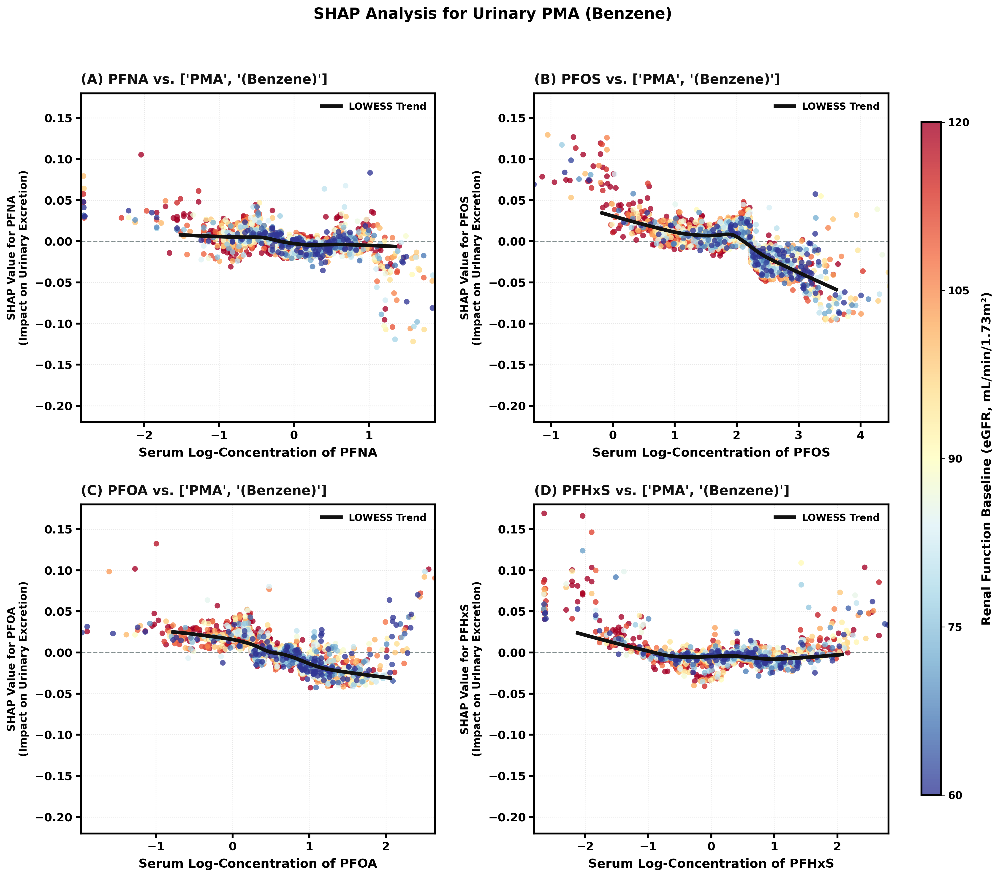

In [ ]:
voc_tasks = [
    {'code': 'URXPMA', 'full_name': 'PMA (Benzene)'},
    {'code': 'URXBMA', 'full_name': 'SBMA (Toluene)'},
    {'code': 'URX2MH', 'full_name': '2MHA (m-Xylene)'},
    {'code': 'URX34M', 'full_name': '34M (m-/p-Xylene)'},
    {'code': 'URXMA',  'full_name': 'MA (Styrene)'}
]

print(" [4/4] ..")
available_columns = clean_df.columns.tolist()

for task in voc_tasks:
    current_code = task['code']
    if current_code == 'URXMA' and 'URXMA' not in available_columns:
        if 'URXPGA' in available_columns:
            current_code = 'URXPGA'
        elif 'URXMA_' in available_columns:
            current_code = 'URXMA_'

    if current_code not in available_columns:
        print(f"")
        continue

    print(f" => {task['full_name']} ...")
    plot_panel_internal(clean_df, current_code, task['full_name'])

print("..")


 => URXMAD | ..
➡️  /content/MA_(Styrene)_SHAP_dependence_plot.png 


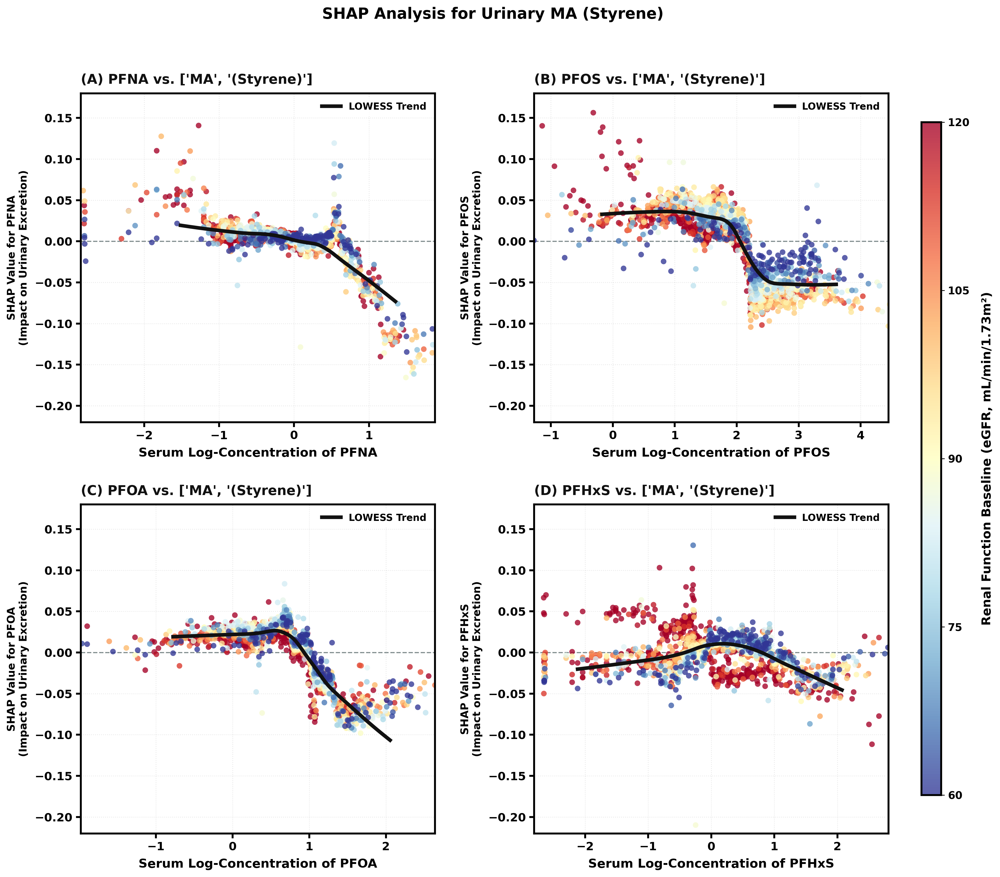

MA (Styrene) 


In [ ]:
import numpy as np
import pandas as pd

ma_task = {'code': 'URXMAD', 'full_name': 'MA (Styrene)'}

print(f" => {ma_task['code']} | ..")

if 'clean_df' in locals() or 'clean_df' in globals():
    df_ma_ready = clean_df.copy()

    df_ma_ready['URXMA'] = df_ma_ready['URXMAD']

    if 'plot_panel_internal' in locals() or 'plot_panel_internal' in globals():
        plot_panel_internal(df_ma_ready, 'URXMA', ma_task['full_name'])
        print(f"{ma_task['full_name']} ")
    else:
        print("..")
        print("..")
else:
    print("")
    print("")


 [Sensitivity Analysis] ..

 => PMA (Benzene) ...
➡️  /content/Supplementary_Figure_S4_PMA_(Benzene)_No_Imputation.png 


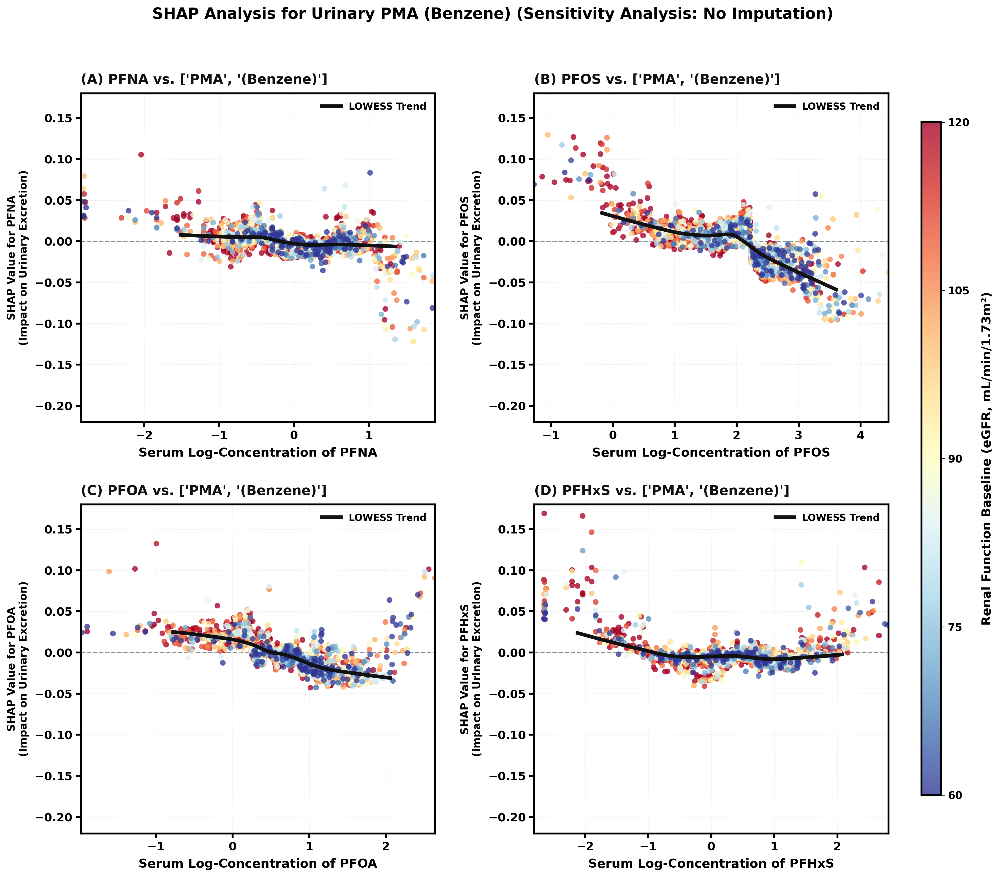


 => BMA (Toluene) ...
➡️  /content/Supplementary_Figure_S4_BMA_(Toluene)_No_Imputation.png 


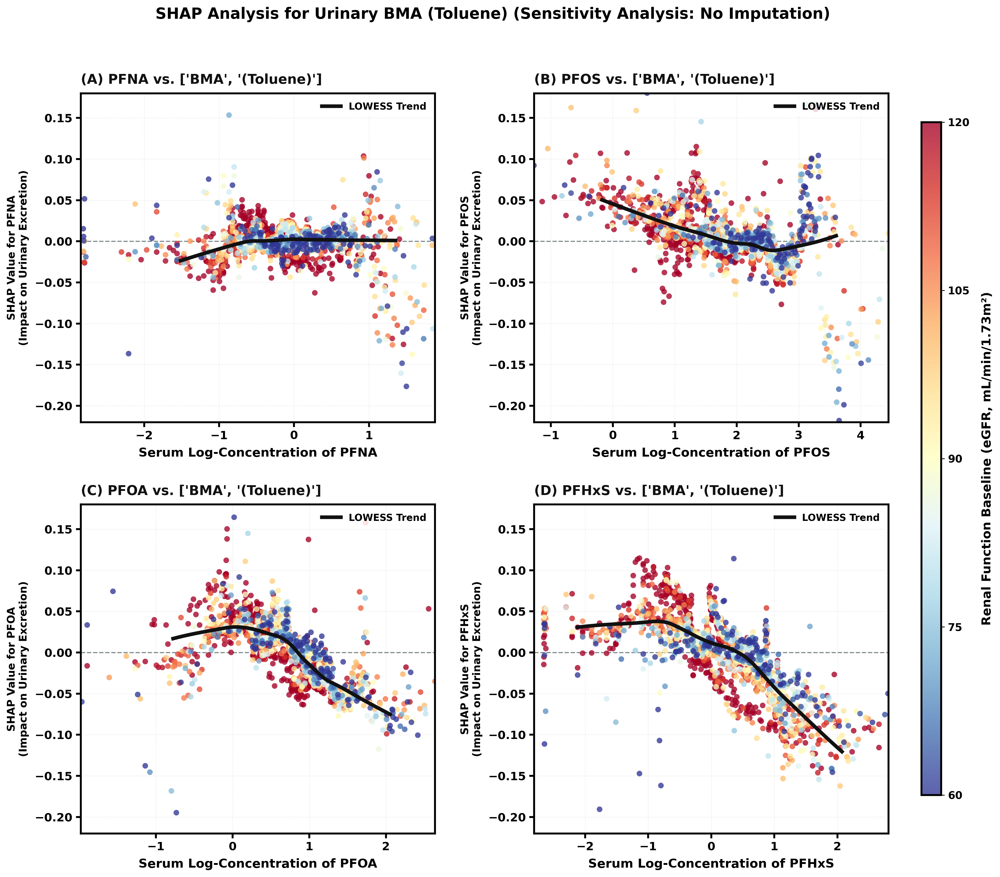


 => 2MH (m-Xylene) ...
➡️  /content/Supplementary_Figure_S4_2MH_(m-Xylene)_No_Imputation.png 


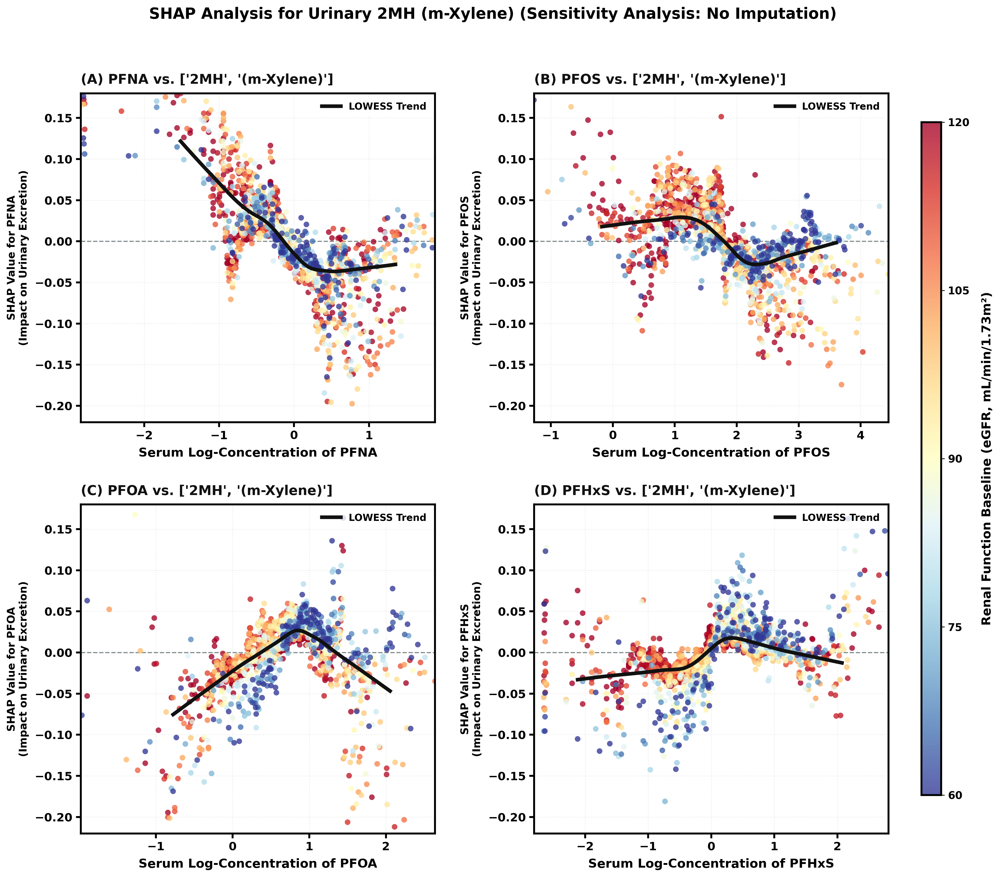


 => 34M (m-/p-Xylene) ...


FileNotFoundError: [Errno 2] No such file or directory: 'Supplementary_Figure_S4_34M_(m-/p-Xylene)_No_Imputation.png'

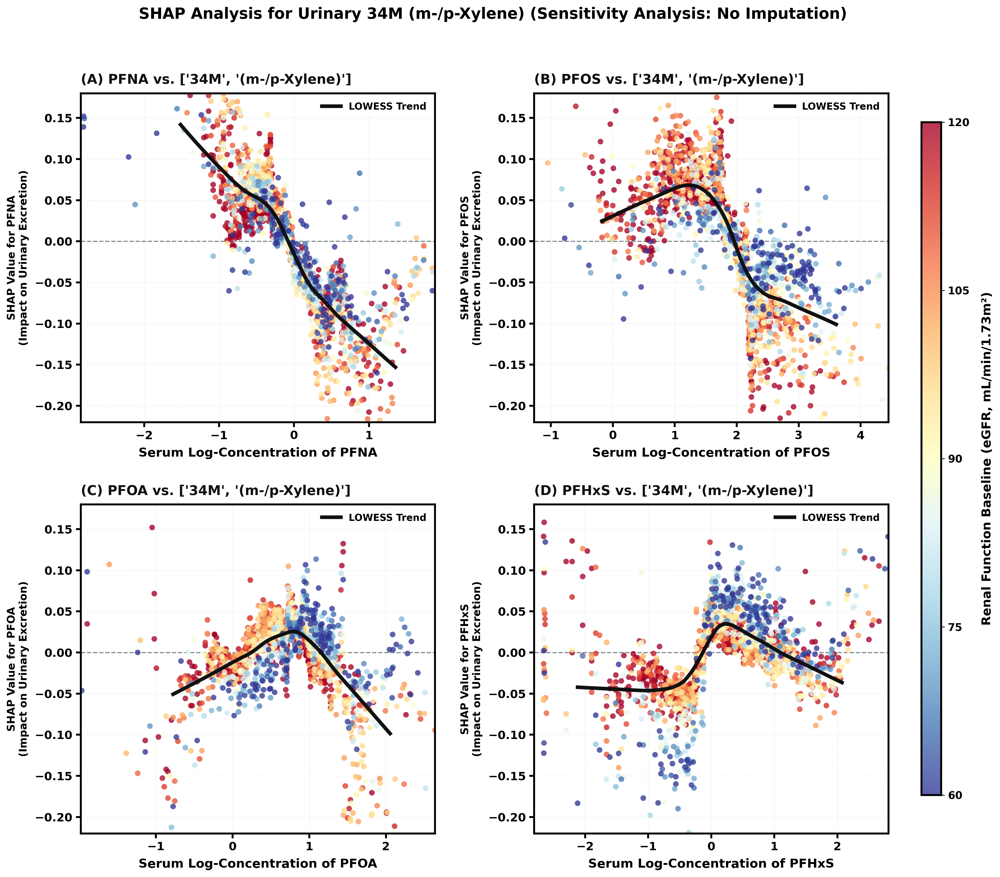

In [ ]:
voc_tasks = [
    {'code': 'URXPMA', 'full_name': 'PMA (Benzene)'},
    {'code': 'URXBMA', 'full_name': 'BMA (Toluene)'},
    {'code': 'URX2MH', 'full_name': '2MH (m-Xylene)'},
    {'code': 'URX34M', 'full_name': '34M (m-/p-Xylene)'},
    {'code': 'URXMA',  'full_name': 'MAD (Styrene)'}
]

print(" [Sensitivity Analysis] ..")

if 'clean_df' in locals() or 'clean_df' in globals():
    available_columns = clean_df.columns.tolist()

    for task in voc_tasks:
        current_code = task['code']

        if current_code == 'URXMA' and 'URXMA' not in available_columns:
            if 'URXMAD' in available_columns:
                current_code = 'URXMAD'
            elif 'URXPGA' in available_columns:
                current_code = 'URXPGA'
            elif 'URXMA_' in available_columns:
                current_code = 'URXMA_'

        if current_code not in available_columns:
            print(f" {current_code} ")
            continue

        print(f"\n => {task['full_name']} ...")

        df_task_ready = clean_df.copy()

        if current_code != 'URXMA' and current_code in ['URXMAD', 'URXPGA', 'URXMA_']:
            df_task_ready['URXMA'] = df_task_ready[current_code]
            target_run_code = 'URXMA'
        else:
            target_run_code = current_code

        plot_panel_internal(df_task_ready, target_run_code, task['full_name'], do_imputation=False)

    print("..")


====== [1/2] LOD/√2 Imputation ======
➡️  /content/MA_(Styrene)_SHAP_dependence_plot.png 


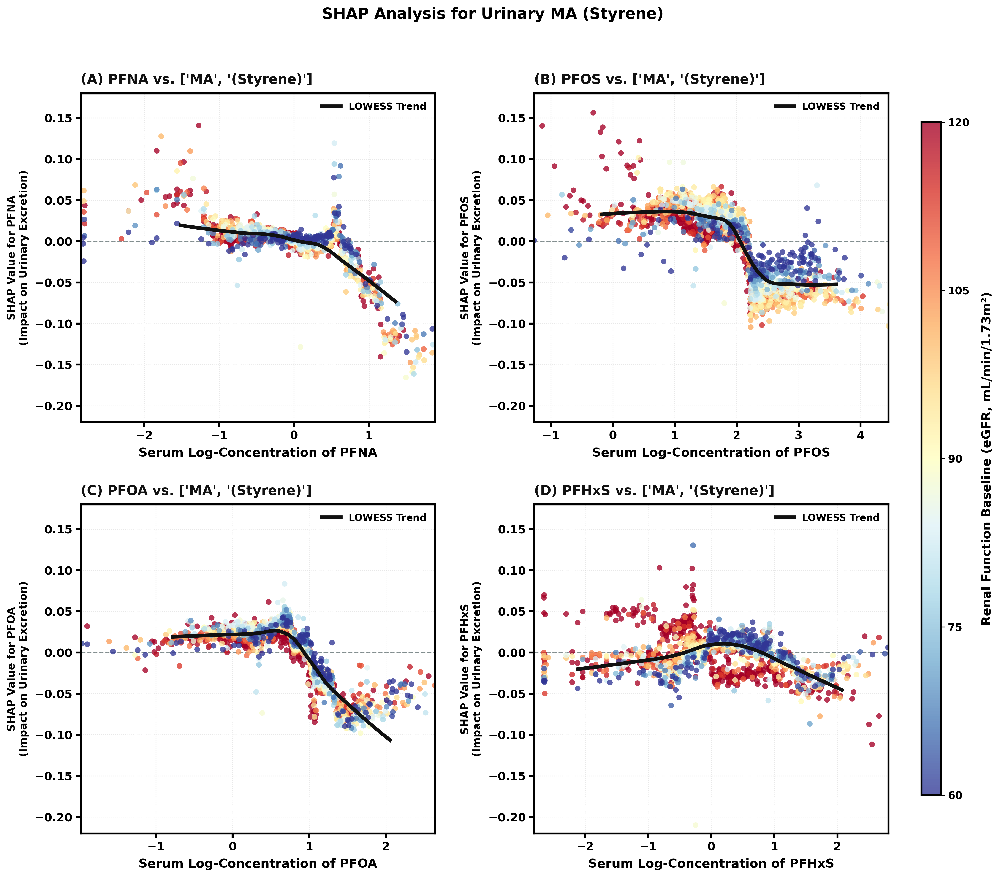



====== [2/2] sensitivity test ====
➡️  /content/Supplementary_Figure_S4_MA_(Styrene)_No_Imputation.png 


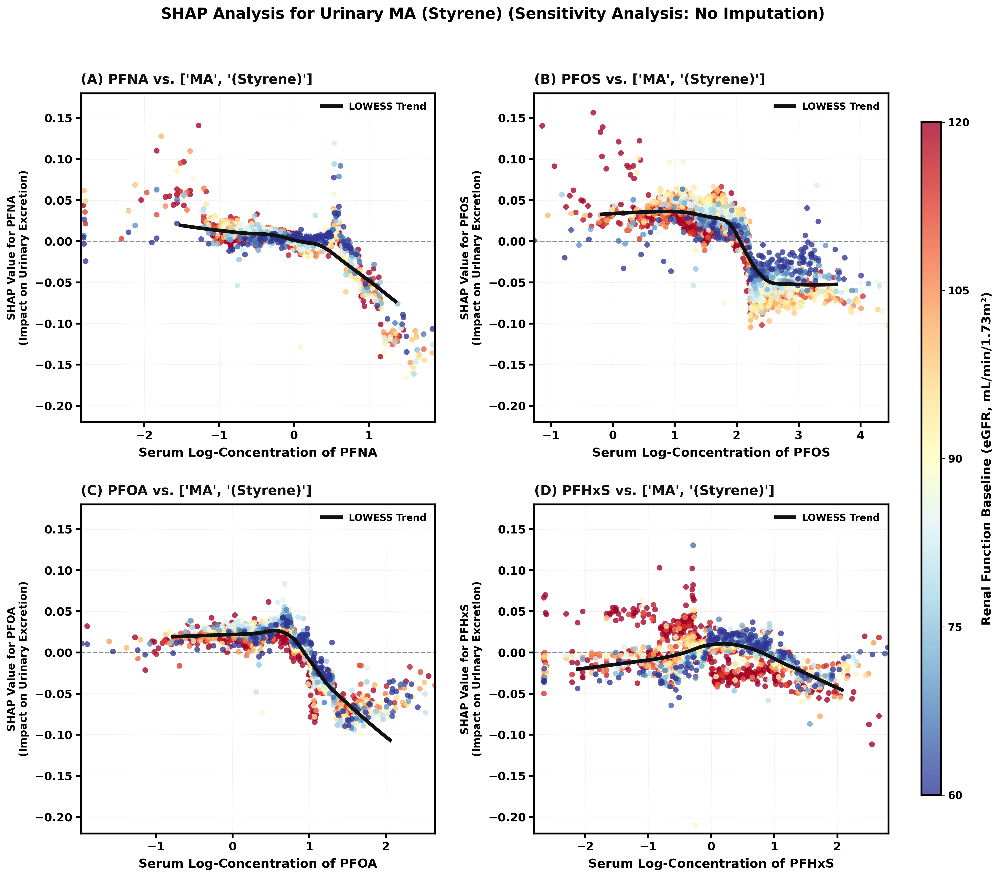

...


In [ ]:
ma_task = {'code': 'URXMAD', 'full_name': 'MA (Styrene)'}

if 'clean_df' in locals() or 'clean_df' in globals():
    df_ma_ready = clean_df.copy()
    if 'URXMAD' in df_ma_ready.columns:
        df_ma_ready['URXMA'] = df_ma_ready['URXMAD']

    if 'plot_panel_internal' in locals() or 'plot_panel_internal' in globals():

        print("====== [1/2] LOD/√2 Imputation ======")
        plot_panel_internal(df_ma_ready, 'URXMA', ma_task['full_name'], do_imputation=True)

        print("\n" + "="*50 + "\n")

        print("====== [2/2] sensitivity test ====")
        plot_panel_internal(df_ma_ready, 'URXMA', ma_task['full_name'], do_imputation=False)

        print("...")